In [1]:
# prompt: mountDrive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import pandas as pd
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
from keras import layers
import tensorflow as tf
# import time
from sklearn.model_selection import train_test_split
import keras




In [3]:


# imagedire2='E:/FCSE/3. Deep Learning/assignment 3/input'
# dataGen=ImageDataGenerator(rescale=1./255,validation_split=0.2)
# generator=dataGen.flow_from_directory(imagedire2,target_size=(1000,1000),batch_size=20,class_mode='categorical')
# for i in range(0,5):
#     batch=generator.next()
#     print(batch[0].shape)

#     image=batch[0][0]
#     print(image)
#     plt.imshow(image)
    # plt.show()

In [4]:
trainImagesPath='/content/drive/MyDrive/input/train'
train_cleaned_images_path='/content/drive/MyDrive/input/train_cleaned'
testImagesPath='/content/drive/MyDrive/input/test'
# trainImagesPath='E:/FCSE/3. Deep Learning/assignment 3/input/train'
# train_cleaned_images_path='E:/FCSE/3. Deep Learning/assignment 3/input/train_cleaned'
# testImagesPath='E:/FCSE/3. Deep Learning/assignment 3/input/test'
#read the images in this directory using cv2
def readImages(path):
    images=[]
    for filename in sorted(os.listdir(path)):
        img=cv2.imread(os.path.join(path,filename))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img=cv2.resize(img,(540,420))
        #changing the data type to float
        img=np.asarray(img, dtype="float32")
        img=img/255.0
        # print(img)
        img = np.reshape(img, (420, 540, 1))
        if img is not None:
            images.append(img)
    return images
trainimages=readImages(trainImagesPath)
train_cleaned_images=readImages(train_cleaned_images_path)
testimages=readImages(testImagesPath)


In [5]:
print(trainImagesPath)
print(train_cleaned_images_path)
trainFileNames=sorted(os.listdir(trainImagesPath))
train_cleaned_images_names=sorted(os.listdir(train_cleaned_images_path))
#compare the lists
def compareLists(list1,list2):
    for i in range(len(list1)):
        if list1[i]!=list2[i]:
            return False
    return True
print(trainFileNames)
print(train_cleaned_images_names)
print(compareLists(trainFileNames,train_cleaned_images_names))

/content/drive/MyDrive/input/train
/content/drive/MyDrive/input/train_cleaned
['101.png', '102.png', '104.png', '105.png', '107.png', '108.png', '11.png', '110.png', '111.png', '113.png', '114.png', '116.png', '117.png', '119.png', '12.png', '120.png', '122.png', '123.png', '125.png', '126.png', '128.png', '129.png', '131.png', '132.png', '134.png', '135.png', '137.png', '138.png', '14.png', '140.png', '141.png', '143.png', '144.png', '146.png', '147.png', '149.png', '15.png', '150.png', '152.png', '153.png', '155.png', '156.png', '158.png', '159.png', '161.png', '162.png', '164.png', '165.png', '167.png', '168.png', '17.png', '170.png', '171.png', '173.png', '174.png', '176.png', '177.png', '179.png', '18.png', '180.png', '182.png', '183.png', '185.png', '186.png', '188.png', '189.png', '191.png', '192.png', '194.png', '195.png', '197.png', '198.png', '2.png', '20.png', '200.png', '201.png', '203.png', '204.png', '206.png', '207.png', '209.png', '21.png', '210.png', '212.png', '213.pn

In [6]:
print(len(trainFileNames))
print(len(train_cleaned_images_names))
print(len(testimages))

144
144
72


In [7]:

print(trainimages[0][:,:,0])

[[0.9137255  0.91764706 0.9254902  ... 0.90588236 0.90588236 0.9137255 ]
 [0.9098039  0.8980392  0.8980392  ... 0.9254902  0.92156863 0.9137255 ]
 [0.8666667  0.87058824 0.88235295 ... 0.9137255  0.92156863 0.9254902 ]
 ...
 [0.85490197 0.8352941  0.84313726 ... 0.8666667  0.87058824 0.89411765]
 [0.8745098  0.8745098  0.8862745  ... 0.8862745  0.84313726 0.81960785]
 [0.92156863 0.8980392  0.8862745  ... 0.6117647  0.3764706  0.23921569]]


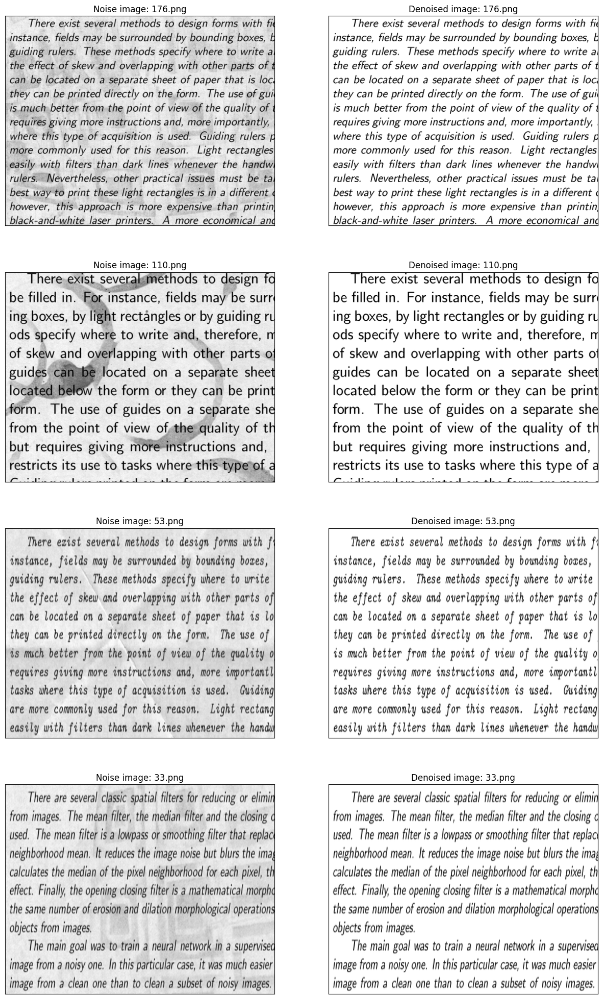

In [8]:
plt.figure(figsize=(15,25))
def displayImages(TrainImages,TrainCleanedImages,trainFileNames,train_cleaned_images_names):
    for i in range(0,8,2):
        plt.subplot(4,2,i+1)
        plt.xticks([])              #Removes the x-axis and y-axis tick labels
        plt.yticks([])
        randomImage=np.random.randint(0,len(TrainImages))
        plt.imshow(TrainImages[randomImage][:,:,0],cmap='gray')            #display image in grayscale
        plt.title('Noise image: {}'.format(trainFileNames[randomImage]))

        plt.subplot(4,2,i+2)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(TrainCleanedImages[randomImage][:,:,0],cmap='gray')
        plt.title('Denoised image: {}'.format(train_cleaned_images_names[randomImage]))
displayImages(trainimages,train_cleaned_images,trainFileNames,train_cleaned_images_names)

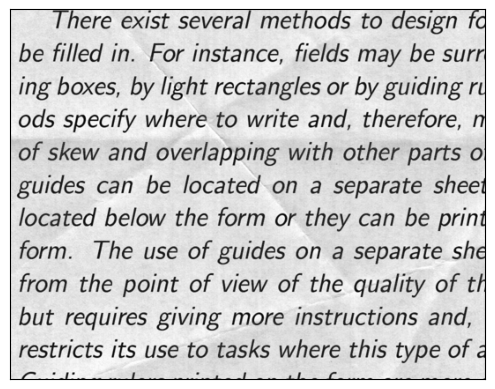

In [9]:
def displayImage(image):
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image,cmap='gray')
    plt.show()
displayImage(trainimages[0])

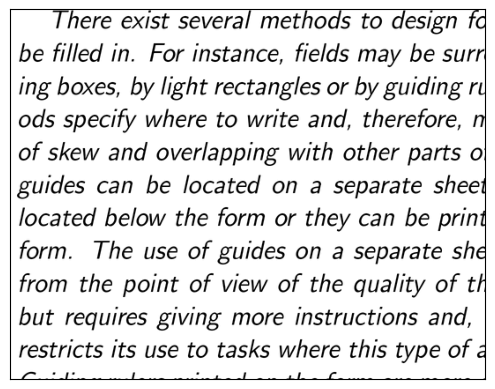

In [10]:
displayImage(train_cleaned_images[0])

In [11]:
trainData=np.asarray(trainimages)
train_cleaned_images=np.asarray(train_cleaned_images)
testData=np.asarray(testimages)
Xtrain,Xval,Ytrain,Yval=train_test_split(trainData,train_cleaned_images,test_size=0.1,random_state=42)

In [12]:

print ("the shape of",Xtrain.shape)
print("the shape of first element",Xtrain[0].shape)
print("the shape of first element",Xtrain[0][:,:,0].shape)
print("the first element: ",Xtrain[0])
print("the first element2: ",Xtrain[0][:,:,0])

the shape of (129, 420, 540, 1)
the shape of first element (420, 540, 1)
the shape of first element (420, 540)
the first element:  [[[0.83137256]
  [0.81960785]
  [0.8117647 ]
  ...
  [0.8117647 ]
  [0.7882353 ]
  [0.78431374]]

 [[0.84313726]
  [0.83137256]
  [0.8392157 ]
  ...
  [0.81960785]
  [0.7921569 ]
  [0.7921569 ]]

 [[0.83137256]
  [0.84313726]
  [0.8392157 ]
  ...
  [0.7882353 ]
  [0.8117647 ]
  [0.8039216 ]]

 ...

 [[0.827451  ]
  [0.84705883]
  [0.84313726]
  ...
  [0.49019608]
  [0.7137255 ]
  [0.85882354]]

 [[0.8392157 ]
  [0.83137256]
  [0.827451  ]
  ...
  [0.8627451 ]
  [0.8666667 ]
  [0.85490197]]

 [[0.88235295]
  [0.8509804 ]
  [0.8235294 ]
  ...
  [0.84705883]
  [0.827451  ]
  [0.84705883]]]
the first element2:  [[0.83137256 0.81960785 0.8117647  ... 0.8117647  0.7882353  0.78431374]
 [0.84313726 0.83137256 0.8392157  ... 0.81960785 0.7921569  0.7921569 ]
 [0.83137256 0.84313726 0.8392157  ... 0.7882353  0.8117647  0.8039216 ]
 ...
 [0.827451   0.84705883 0.8431

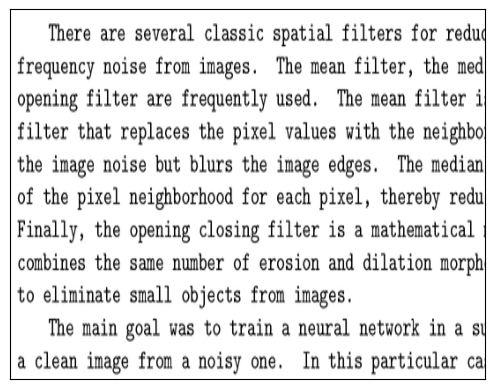

In [13]:
normalimg=Yval[0].reshape(420,540,1)
displayImage(normalimg)

In [14]:
# print(Xtrain.shape)
# print(Xval.shape)
# print(Ytrain.shape)
# print(Yval.shape)
# #i want the shape to be (129,420,540,1)
# Xtrain=Xtrain.reshape(129,420,540,1)
# Xval=Xval.reshape(15,420,520,1)
# Ytrain=Ytrain.reshape(129,420,540,1)
# Yval=Yval.reshape(15,420,520,1)
# print(Xtrain.shape)


In [20]:

def autoencoder_model(height, width):
    inputs = keras.layers.Input(shape=(height, width, 1))
    # Encoder
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    outputs = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)
    return keras.Model(inputs=inputs, outputs=outputs)

height = 420
width = 540
autoencoder_model = autoencoder_model(height, width)
autoencoder_model.summary()
#add early stopping
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2)
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
#compile with binary cross entropy
autoencoder_model.compile(optimizer = optimizer, loss = 'binary_crossentropy',metrics = ['acc'])
history=autoencoder_model.fit(Xtrain,Ytrain, epochs = 20, batch_size=1, validation_data = (Xval,Yval),callbacks=[early_stopping])
loss_values = history.history['loss']
accuracy_values = history.history['acc']

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_5 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 conv2d_18 (Conv2D)          (None, 420, 540, 64)      640       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 210, 270, 64)      0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 210, 270, 32)      18464     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 105, 135, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 105, 135, 32)      9248

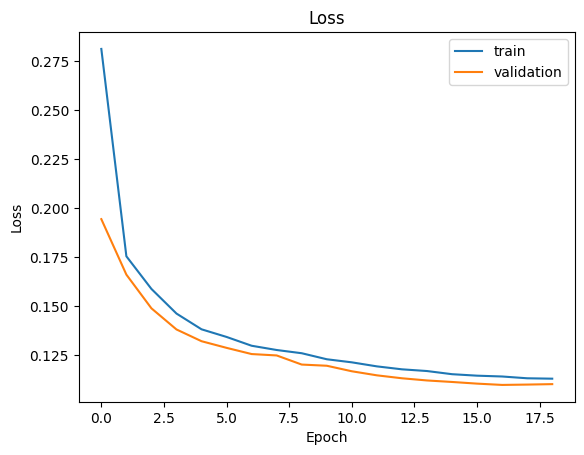

In [17]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
plot_loss(history)

In [ ]:
# model.save('my_model.h5')

# model = keras.models.load_model('my_model.h5')


In [23]:

# start_time = time.time()
def down(filters , kernel_size):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    downsample.add(keras.layers.LeakyReLU())
    return downsample


def up(filters, kernel_size):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    upsample.add(keras.layers.LeakyReLU())
    return upsample


def model(height, width):
    inputs = keras.layers.Input(shape=(height, width, 1))
    d1 = down(64, (3, 3) )(inputs)
    d2 = down(128, (3, 3))(d1)


    u1 = up(128, (3, 3))(d2)
    u2 = up(64, (3, 3))(u1)


    output = keras.layers.Conv2D(3, (3, 3), strides=1, padding='same')(u2)
    return keras.Model(inputs=inputs, outputs=output)

height = 420
width = 540
model = model(height, width)
model.summary()
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer = optimizer, loss = 'mean_absolute_error',metrics = ['acc'])
print(Ytrain.shape)
history=model.fit(Xtrain,Ytrain, epochs = 20, batch_size=1, validation_data = (Xval,Yval))
loss_values = history.history['loss']
accuracy_values = history.history['acc']

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 420, 540, 1)]     0         
                                                                 
 sequential_12 (Sequential)  (None, 210, 270, 64)      640       
                                                                 
 sequential_13 (Sequential)  (None, 105, 135, 128)     73856     
                                                                 
 sequential_14 (Sequential)  (None, 210, 270, 128)     147584    
                                                                 
 sequential_15 (Sequential)  (None, 420, 540, 64)      73792     
                                                                 
 conv2d_31 (Conv2D)          (None, 420, 540, 3)       1731      
                                                                 
Total params: 297603 (1.14 MB)
Trainable params: 297603 (1.

In [24]:
model.save('my_model.h5')

model = keras.models.load_model('my_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


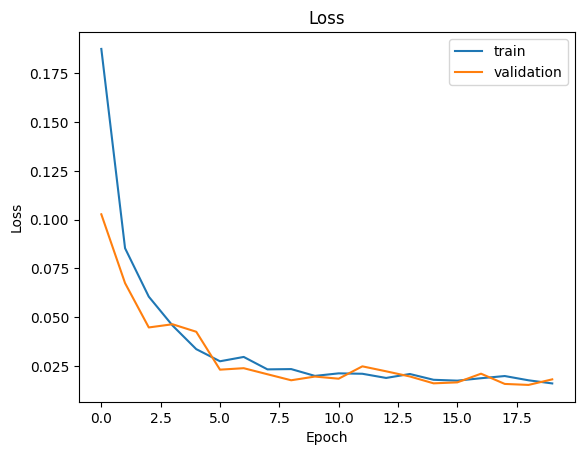

In [25]:
def plot_loss(history):
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.title('Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()
plot_loss(history)

1/1 [==============================] - 0s 117ms/step
the shape of converted predicted image:  (420, 540, 1)
the shape of predicted image:  (420, 540, 3)
the shape of normal image:  (420, 540, 1)
1/1 [==============================] - 0s 18ms/step
the shape of converted predicted image:  (420, 540, 1)
the shape of predicted image:  (420, 540, 3)
the shape of normal image:  (420, 540, 1)
1/1 [==============================] - 0s 23ms/step
the shape of converted predicted image:  (420, 540, 1)
the shape of predicted image:  (420, 540, 3)
the shape of normal image:  (420, 540, 1)


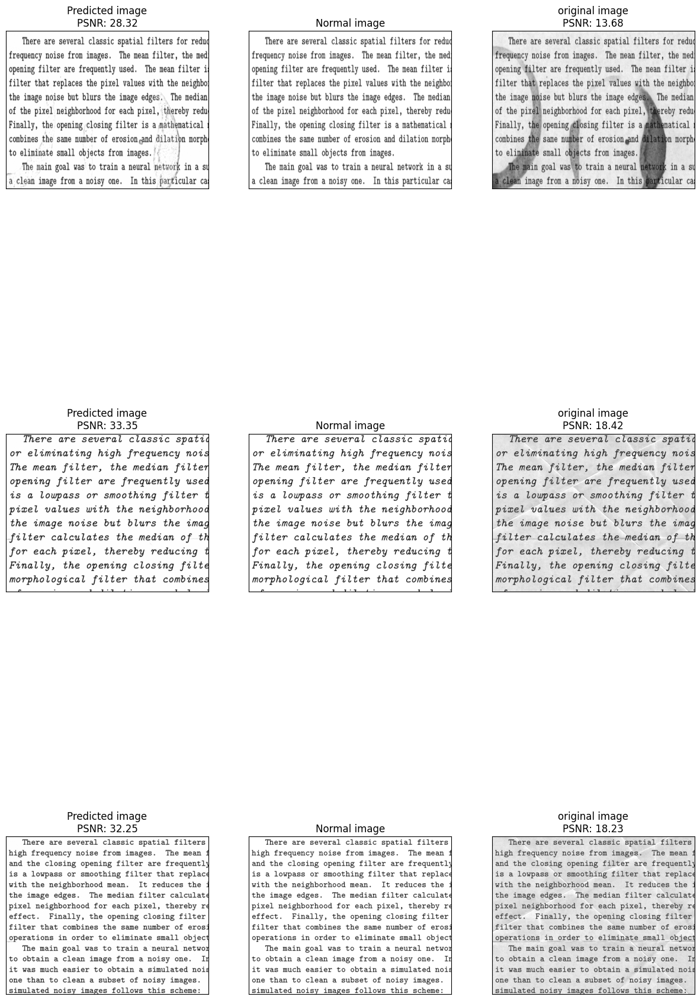

In [26]:

def getPredictedImage(model,Ximage,Yimage):

        predictedImage=model.predict(Ximage.reshape(1,420,540,1))
        predictedImage=np.clip(predictedImage,0,1).reshape(420,540,3)
        normalImage=Yimage.reshape(420,540,1)
        originalImage=Ximage.reshape(420,540,1)
        convertpredictedImage=cv2.cvtColor(predictedImage,cv2.COLOR_BGR2GRAY).reshape(420,540,1)
        print("the shape of converted predicted image: ",convertpredictedImage.shape)
        print("the shape of predicted image: ",predictedImage.shape)
        print("the shape of normal image: ",normalImage.shape)

        return convertpredictedImage,normalImage,originalImage


    # return predictedImage
def calculatePSNR(originalImage,predictedImage):
  mse=np.mean((originalImage-predictedImage)**2)
  if mse==0:
      return 100
  max_pixel=1.0
  psnr=20*np.log10(max_pixel/np.sqrt(mse))
  return psnr
def displayImages(model,Xval,Yval):
        fig=plt.figure(figsize=(15,25))
        j=0
        for i in range(0,9,3):
            predictedImage,normalImage,originalImage=getPredictedImage(model,Xval[j],Yval[j])
            psnr_normal_predicted = calculatePSNR(normalImage, predictedImage)
            psnr_original_normal = calculatePSNR(originalImage, normalImage)
            fig.add_subplot(3,3,i+1)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(predictedImage,cmap='gray')
            plt.title(f'Predicted image\nPSNR: {psnr_normal_predicted:.2f}')

            fig.add_subplot(3,3,i+2)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(normalImage,cmap='gray')
            plt.title(f'Normal image')

            fig.add_subplot(3,3,i+3)
            plt.xticks([])
            plt.yticks([])
            plt.imshow(originalImage,cmap='gray')
            plt.title(f'original image\nPSNR: {psnr_original_normal:.2f}')
            # plt.show()

            j+=1

# plt.imshow()
displayImages(model,Xval,Yval)

In [27]:
def PredictTestImages(model,testData):
    predictedImages=[]
    for i in range(len(testData)):
        predictedImage=model.predict(testData[i].reshape(1,420,540,1))
        predictedImage=np.clip(predictedImage,0,1).reshape(420,540,3)
        convertpredictedImage=cv2.cvtColor(predictedImage,cv2.COLOR_BGR2GRAY).reshape(420,540,1)
        predictedImages.append(convertpredictedImage)
    return predictedImages
predictedImages=PredictTestImages(model,testData)


1/1 [==============================] - 0s 22ms/step


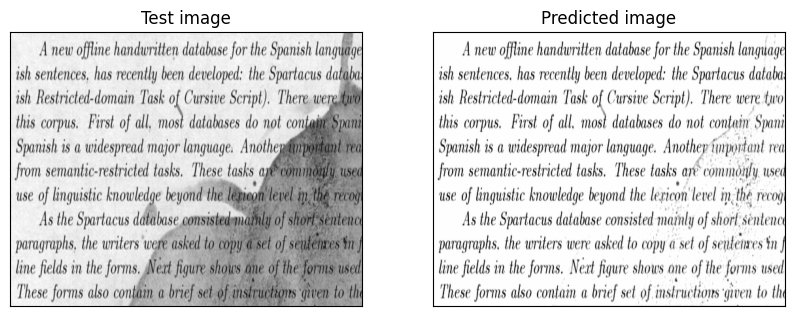

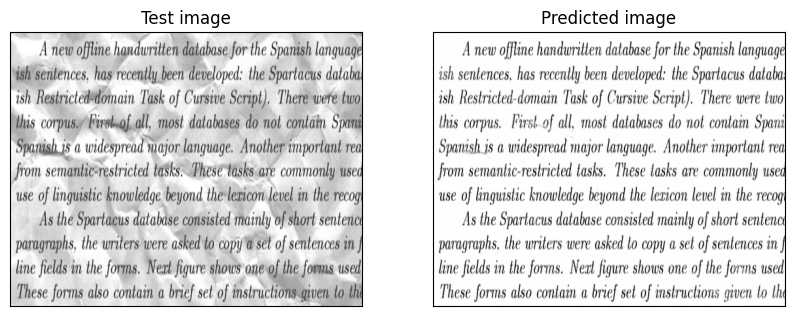

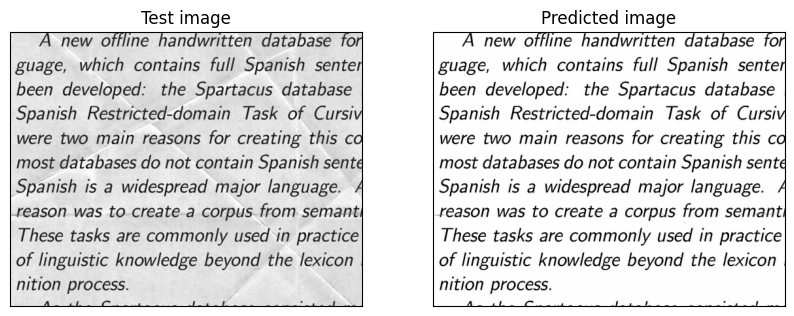

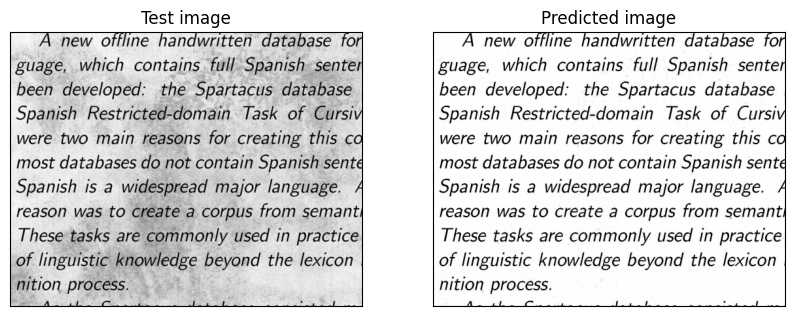

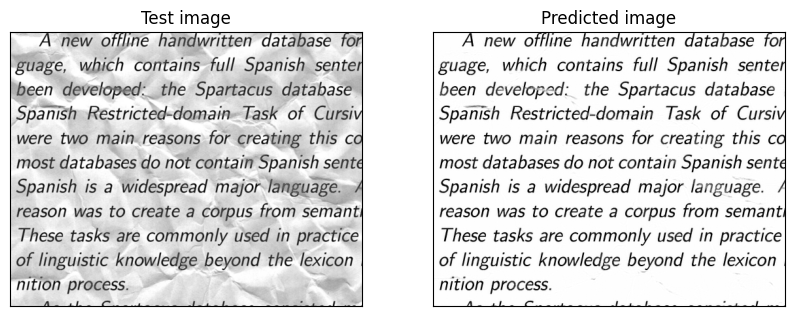

...

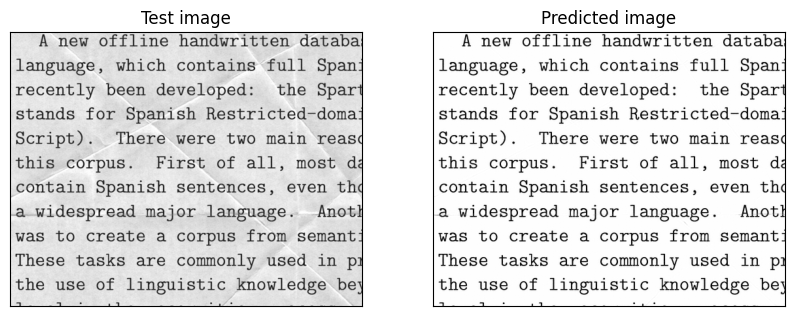

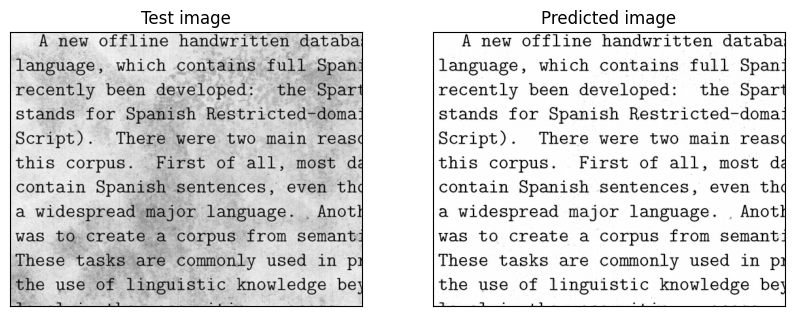

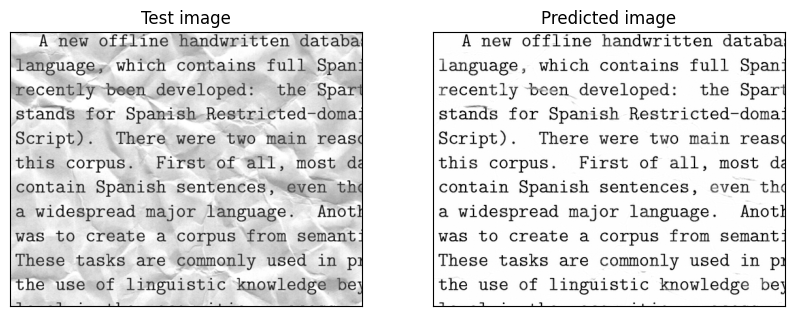

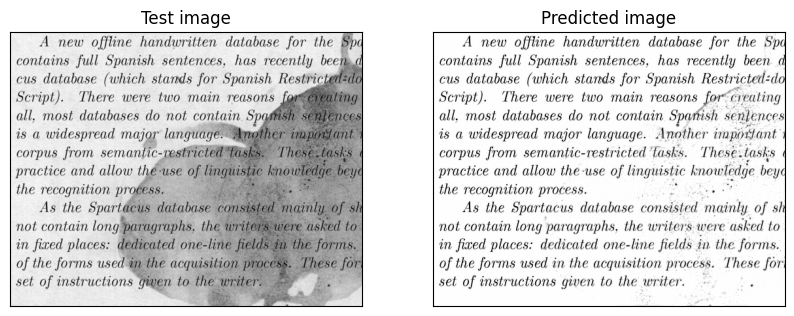

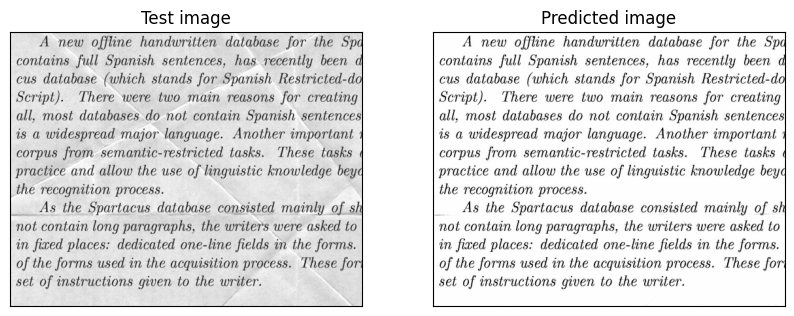

In [28]:
def plotTestImages(testData,predictedImages):

    for i in range(len(testData)):
        #display the test image of index i with the predicted image of index i
        fig=plt.figure(figsize=(10,10))
        fig.add_subplot(1,2,1)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(testData[i].reshape(420,540,1),cmap='gray')
        plt.title('Test image')
        fig.add_subplot(1,2,2)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(predictedImages[i],cmap='gray')
        plt.title('Predicted image')
        plt.show()
        plt.close()
plotTestImages(testData,predictedImages)

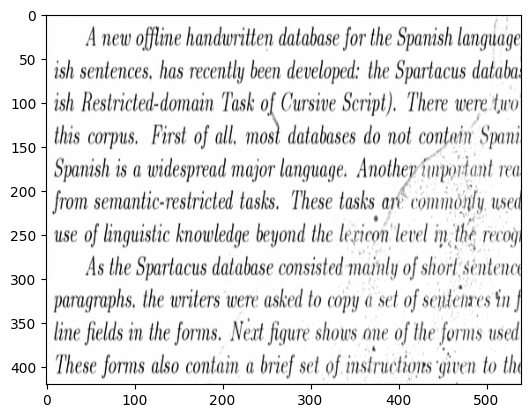

Text from predicted image 1:
A new offline handwritten database for the Spanish language
ish sentences, has recently been developed: the Spartacus databa
ish Restricted-domain Task of Cursive Script). There were two
this corpus. First of all, most databases do nol contain Spani
Spanish is a widespread major language. Anot thep finpordant rea
from semantic-restricted tasks, These tasks, art commodatly, used
use of linguistic knowledge beyond the | lericon level i in, the recoj)

As the Spartacus database consisted mainly of shorl, sentence
paragraphs, the writers were asked to copy « set of sendenves $n |
line fields in the forms, Nect figure shows one of the forms used
These forms also contain a brief set of instructions given to th

_________________________


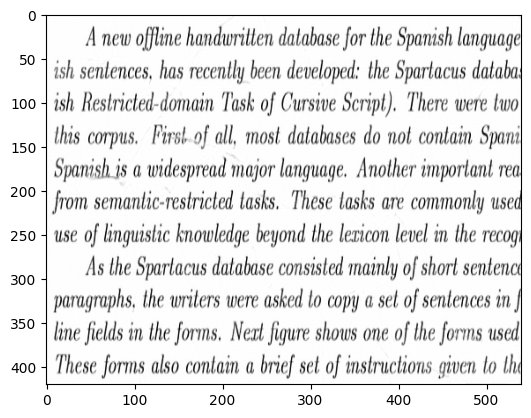

Text from predicted image 2:
A new offline handwritten database for the Spanish language
ish sentences, has recently been developed: the Spartacus databa:
h Reslricted-domain Task of Cursive Script). There were two
this corpus. First-of all, most databases do not contain Spani
Spanish.is a widespread major language. Another important rea
Jrom semantic-restricted tasks. These lasks are commonly used
use of linguistic knowledge beyond the lexicon level in the recog

As the Spartacus database consisted mainly of short sentence
paragraphs, the writers were asked lo copy a set of sentences in |
line fields in the forms. Neat figure shows one of the forms used
These forms also contain a brief set of instructions given lo th


_________________________


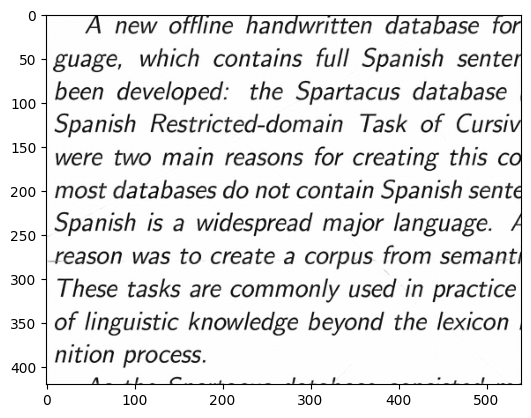

Text from predicted image 3:
A new offline handwritten database for
guage, which contains full Spanish senter
been developed: the Spartacus database |
Spanish Restricted-domain Task of Cursiv
were two main reasons for creating this co
most databases do not contain Spanish sente
Spanish is a widespread major language. /
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

Se ep Lape aap aenee oe i egetiaes “pelh ree Gah eee mee aL te dei eep ee LPNS

_________________________


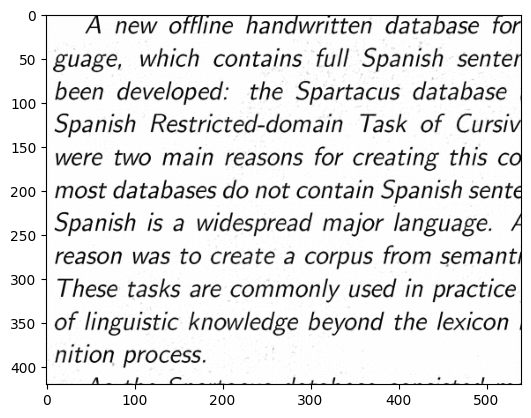

Text from predicted image 4:
A new offline handwritten database for
guage, which contains full Spanish senter
been developed: the Spartacus database |
Spanish Restricted-domain Task of Cursiv
were two main reasons for creating this co
most databases do not contain Spanish sente
Spanish is a widespread major language. /
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

Se yoeeel eek ie—dekionbaas Mie amend FieY eA eae akin Etat Eee ask ak ee

_________________________


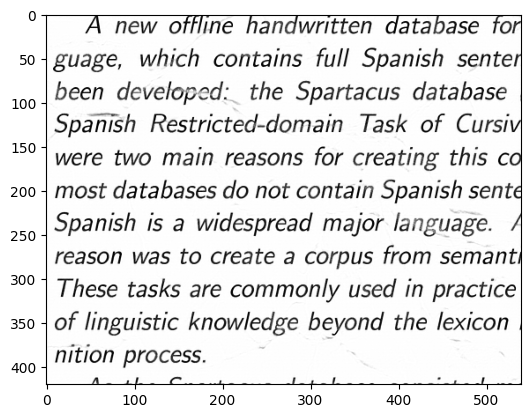

Text from predicted image 5:
A new offline handwritten database for
guage, which contains full Spanish senter
been developed:_ the Spartacus database |
Spanish Restricted-domain Task of Cursiv
were two main reasons for creating this co
most databases do not contain Spanish sente
Spanish is a widespread major language. /
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

Yeeagite dias este terete pal tea eaten ssiconen’ Meee Stree

_________________________


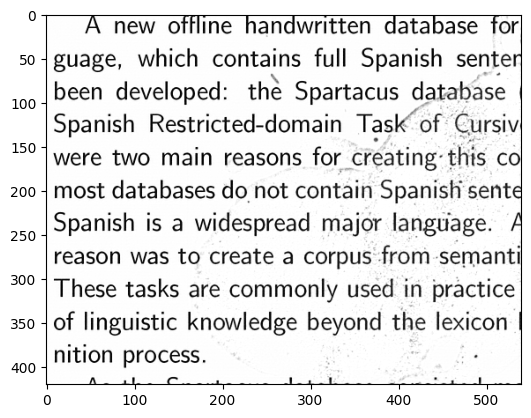

Text from predicted image 6:
A new offline handwritten database for
guage, which contains full Spanish senter
been developed: the Spartacus database |
Spanish Restricted-domain Task “of Cursiv
were two main reasons for creating: this co
most databases do not contain Spanish sente
Spanish is a widespread major language. A
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

wenger Mebcies Safe et oh acetate Cree


_________________________


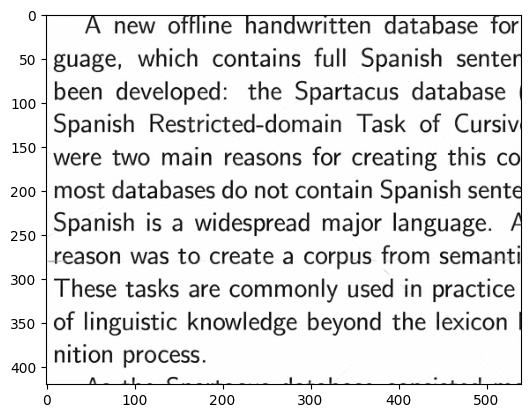

Text from predicted image 7:
A new offline handwritten database for
guage, which contains full Spanish senten
been developed: the Spartacus database |
Spanish Restricted-domain Task of Cursiv
were two main reasons for creating this co
most databases do not contain Spanish sente
Spanish is a widespread major language. /
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

eet Seri seeer a


_________________________


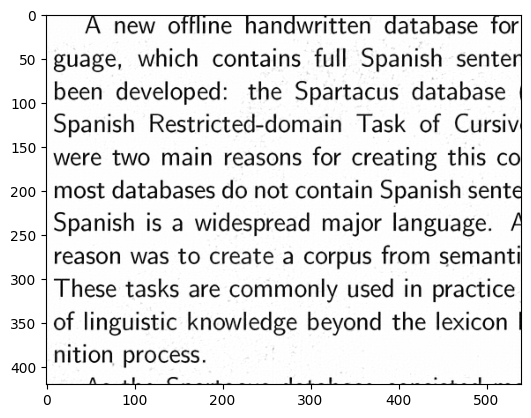

Text from predicted image 8:
A new offline handwritten database for
guage, which contains full Spanish senten
been developed: the Spartacus database |
Spanish Restricted-domain Task of Cursiv
were two main reasons for creating this co
most databases do not contain Spanish sente
Spanish is a widespread major language. /
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

Pe Nmny Gh av ne erica ae acs


_________________________


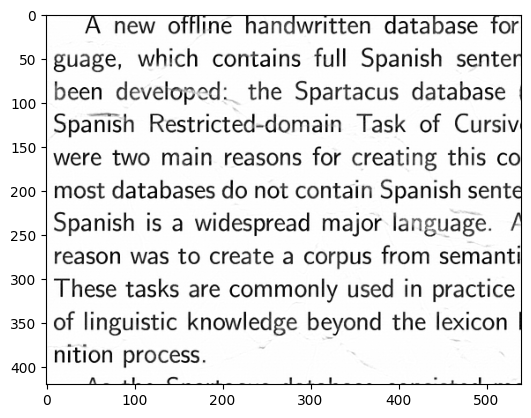

Text from predicted image 9:
A new offline handwritten database for
guage, which contains full Spanish senten
been developed: the Spartacus database |
Spanish Restricted-domain Task of Cursiv
were two main reasons for creating this co
most databases do not contain Spanish sente
Spanish is a widespread major language. /
reason was to create a corpus from semanti
These tasks are commonly used in practice
of linguistic knowledge beyond the lexicon |
nition process.

9p CREE iaetnnae CMe gem hae era rp


_________________________


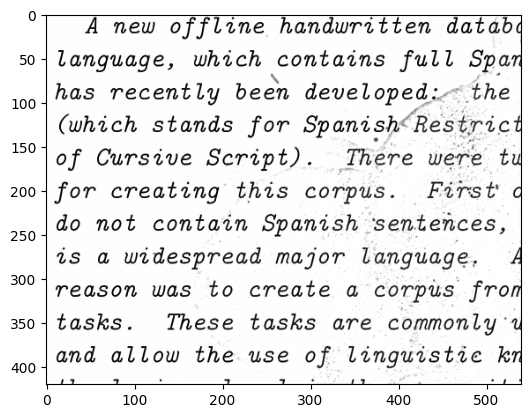

Text from predicted image 10:
A new offline handwritten databc
language, which contains full Span
has recently been developed: the
(which stands for Spanish“Restrict
of Cursive Script). There were tu
for creating this corpus. First o
do not contain Spanish ‘sentences,
is a widespread major language, A
reason was to create a corpus fron
tasks. These tasks are commonly u
and allow the use of linguistie kn

_________________________


In [ ]:
import pytesseract
from PIL import Image


def extract_text_from_image(image):
    # Convert the image to grayscale
    # plt.imshow(image)
    # plt.close()
    image=image.reshape(420,540)
    image=image*255
    image = image.astype(np.uint8)
    image=Image.fromarray(image)

    # image.show()
    # Perform OCR using Tesseract
    image = image.convert("L")
    #show the image
    # return None
    pytesseract.pytesseract.tesseract_cmd = (
    r"C:\\Program Files\\Tesseract-OCR\\tesseract.exe"
)

    text = pytesseract.image_to_string(image)
    print("the text is: ", text)
    return text
# extract_text_from_image(predictedImages[0])
# Extract text from predicted images
extracted_text = []
for image in predictedImages:
    text = extract_text_from_image(image)
    #show the image
    plt.imshow(image,cmap='gray')
    plt.show()
    plt.close()
    print(f"Text from predicted image {i+1}:")
    print(text)
    print("_________________________")
    extracted_text.append(text)


In [ ]:

# Print the extracted text
